<a href="https://colab.research.google.com/github/SapsalevEV/CDTI_OCR/blob/main/detectron.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

####Установка библиотек, выпонить в начале

In [ ]:
!pip install torch torchvision torchaudio
!pip install opencv-python
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu121/torch2.0/index.html || pip install git+https://github.com/facebookresearch/detectron2.git

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu121/torch2.0/index.html


#### GO

In [ ]:
import cv2
import torch
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2 import model_zoo
from detectron2.utils.visualizer import Visualizer
import matplotlib.pyplot as plt
#from google.colab import drive
import os

In [ ]:
# Подключение Google Drive для доступа к изображениям
#drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
def setup_model():
    # Загрузка конфигурации для Mask R-CNN
    cfg = get_cfg()
    cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
    cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # Устанавливаем порог предсказания
    cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")

    # Настраиваем конфигурацию
    cfg.MODEL.DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

    predictor = DefaultPredictor(cfg)
    return predictor


In [ ]:
def detect_document(image_path, predictor):
    # Загрузка изображения
    image = cv2.imread(image_path)

    # Применяем предсказание модели
    outputs = predictor(image)

    # Отображаем предсказанные границы документа
    v = Visualizer(image[:, :, ::-1], scale=1.0)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    # Возвращаем изображение с предсказанными границами
    return out.get_image()[:, :, ::-1], outputs


In [ ]:
def show_results(image):
    # Преобразование изображения для отображения через matplotlib
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

model_final_f10217.pkl: 178MB [00:00, 205MB/s]                           
/usr/local/lib/python3.10/dist-packages/torch/functional.py:513: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3609.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


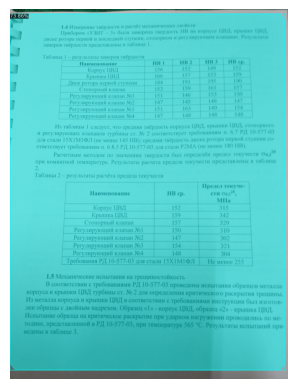

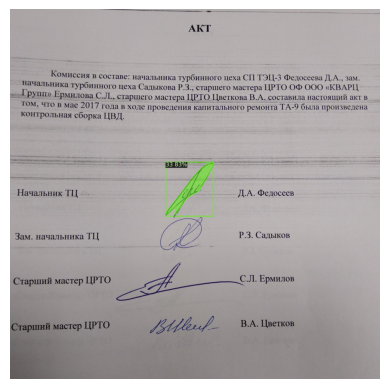

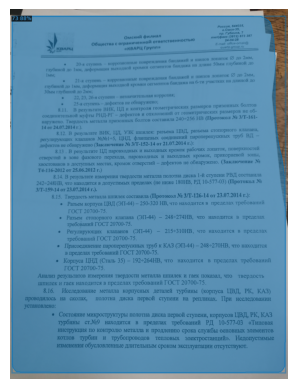

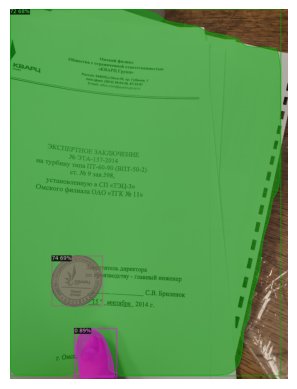

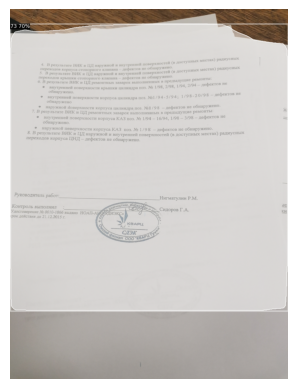

...

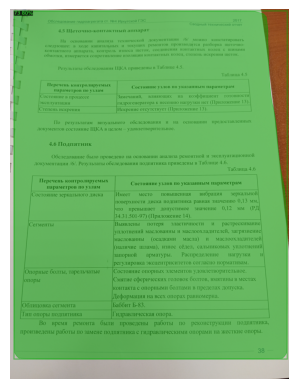

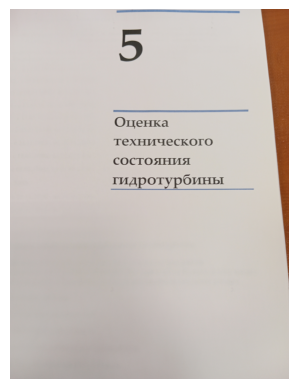

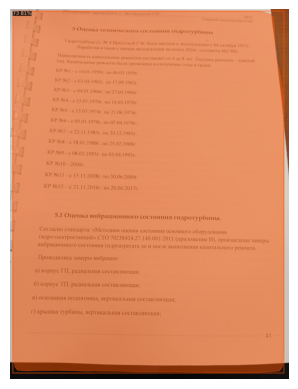

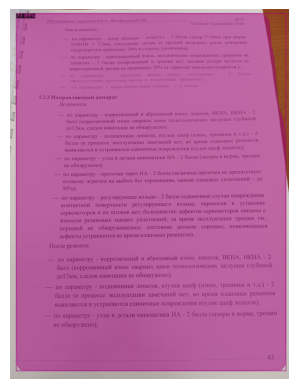

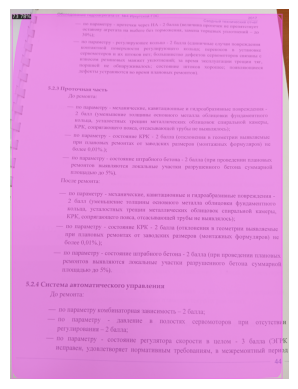

In [ ]:
if __name__ == "__main__":
    # Устанавливаем модель
    predictor = setup_model()

    # Указываем путь к каталогу с изображениями (используем Google Drive)
    images_dir = '/content/drive/My Drive/MyDataset/'  # Укажите свой путь к каталогу с изображениями на Google Drive

    # Проходим по всем изображениям в каталоге
    for image_name in os.listdir(images_dir):
        image_path = os.path.join(images_dir, image_name)
        if os.path.isfile(image_path):
            # Применяем модель для предсказания границ документа
            processed_image, outputs = detect_document(image_path, predictor)

            # Отображаем результат
            show_results(processed_image)